# **Assignment 1 - Image Captioning**

<div style="border: 3px solid #222; padding: 16px; border-radius: 10px; background-color: #1c1f26; font-family: 'Helvetica Neue', Helvetica, Arial, sans-serif; color: #e0e0e0;">
  <div style="display: flex; align-items: center; gap: 8px; margin-top: 12px;">
    <span style="font-size: 24px; color: #ff5555;">&#128274;</span>
    <span style="font-size: 16px;"><strong>Project:</strong> Assignments</span>
  </div>
  <div style="display: flex; align-items: center; gap: 8px; margin-top: 8px;">
    <span style="font-size: 20px; color: #ff5555;">&#128218;</span>
    <span style="font-size: 16px;"><strong>Course:</strong> Deep Network Development</span>
  </div>
  <div style="margin-top: 12px; font-size: 14px;">
    <span style="font-size: 18px; color: #6e8192;">&#128100;</span>
    <span style="font-weight: bold;"><strong>Authors:</strong></span> Tamás Takács, Imre Molnár (PhD students, Department of Artificial Intelligence, Eötvös Loránd University)
  </div>
</div>
<hr style="border: none; border-top: 2px solid #444;">
<br>

<img src="https://repository-images.githubusercontent.com/83958320/8f162500-8ace-11e9-94ee-0b86d27bbc5e" alt="1" border="0">

This notebook contains the required task for the **first assignment** of the **Deep Network Development (DNDEG)** course. Read the task description carefully and **fill in the empty code cells**.

# **Task Description**

Your task is to train your **own custom image captioning model** and compare its performance with an existing **pre-trained** model. You will work with the `Flickr8k` [dataset](https://www.kaggle.com/datasets/adityajn105/flickr8k), ensuring it is properly split into **training, validation,** and **test** sets. The model should follow an **Encoder-Decoder + Attention** structure, where the encoder can use a **pre-trained backbone** such as *ResNet*, but it must be **fine-tuned**. An **attention layer** is required to visualize what the network has learned. After training, you will **evaluate and compare** the performance of your model against a **pre-trained** one, analyzing the **generated captions** and the **attention mechanisms**.

The `Flickr8k` dataset consists of **8000 images**, each paired with **5 captions**, resulting in a total of **40,000 captions**. It is your **design choice** how you implement the **dataset and batching process**. A common approach is to treat each caption as a separate data point, yielding **40,000 datapoints** in total.

The **tokenization process** is also up to you. Since the dataset contains a vast vocabulary, it may include words that appear only once. To improve model efficiency, it is **good practice to limit the vocabulary size**.

During **validation and testing**, every image has **5 reference captions**. To ensure a robust `BLEU` **score calculation**, it is recommended to compute `BLEU` scores using **all 5 matching captions** as reference captions for each image.

# **Expectations**

- Your model is **not expected to achieve state-of-the-art performance**, but it should perform **better than random guessing**. The **loss should decrease** throughout training, and the model’s performance should be monitored to prevent overfitting or underfitting.

- You will work with the `Flickr8k` dataset, which should be split into **train, validation, and test** sets. The `training` set is used to train the image captioning model, the `validation` set helps fine-tune hyperparameters and monitor performance, and the `test` set is used for final evaluation.

- To assess model performance, include **visualizations of loss values** and **evaluation metrics** for the dataset splits.

- You are free to choose any **pre-trained model** (`blip`, `vit-gpt2-flickr8k`, etc.) for model comparison at the end.

# **Requirements**

- Data Preparation and Visualization:
  - Ensure the **Flickr8k dataset** is correctly split into **train, validation, and test sets**.
  - Display **sample images with their original captions**.
  - Visualize **tokenized captions** to ensure proper preprocessing.

- Model Training and Performance Monitoring:
  - Train an **Encoder-Decoder + Attention** model using the training set.
  - Track **training and validation loss** using visualizations (e.g., `Matplotlib`, `Seaborn`).
  - Monitor **BLEU-1, BLEU-2, BLEU-3, and BLEU-4 scores** for a greedy decoder throughout training.

- Implement **techniques to avoid overfitting**, such as:
    - **Early stopping** to halt training when validation loss stops improving.
    - **Regularization** (e.g., dropout, weight decay) to improve generalization.
    - **Experimenting with different loss functions** to find the most effective approach.
    - **Saving the best-performing model** during training for later evaluation.

- Model Comparison:
  - Evaluate and compare your **custom-trained model** with a **pre-trained model** on the same batch of test images.
  - **Visualize generated captions** and compare them to ground-truth captions.
  - Compute **BLEU scores** using all five reference captions for a given image.
  - Analyze and explain the **strengths and weaknesses** of both models based on performance differences.

- Optionally, use **WandB (Weights and Biases)** or **TensorBoard** to:
  - Track and visualize **training progress**.
  - Monitor **model performance** over time.
  - Log **key metrics**.

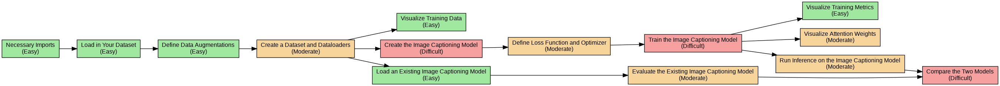

In [ ]:
# @title Image Captioning Tasks
# %%capture flowchart_output
# HIDDEN CELL
from graphviz import Digraph
from IPython.display import Image as IMG

def create_flowchart(output_filename='flowchart'):
    dot = Digraph(name='Simplified Object Detection', format='png')
    dot.attr(rankdir='LR')
    dot.attr('node', shape='box', style='filled', fontsize='12', fontname='Arial')

    dot.node('Imports', 'Necessary Imports\n(Easy)', fillcolor='#A0E7A0')

    dot.node('LoadData', 'Load in Your Dataset\n(Easy)', fillcolor='#A0E7A0')

    dot.node('AugmentData', 'Define Data Augmentations\n(Easy)', fillcolor='#A0E7A0')

    dot.node('DatasetDataloader', 'Create a Dataset and Dataloaders\n(Moderate)', fillcolor='#F6D49A')

    dot.node('VisualizeSample', 'Visualize Training Data\n(Easy)', fillcolor='#A0E7A0')
    dot.node('CreateModel', 'Create the Image Captioning Model\n(Difficult)', fillcolor='#F6A0A0')

    dot.node('Hyperparameters', 'Define Loss Function and Optimizer\n(Moderate)', fillcolor='#F6D49A')

    dot.node('TrainModel', 'Train the Image Captioning Model\n(Difficult)', fillcolor='#F6A0A0')

    dot.node('VisualizeTrain', 'Visualize Training Metrics\n(Easy)', fillcolor='#A0E7A0')
    dot.node('VisualizeAtt', 'Visualize Attention Weights\n(Moderate)', fillcolor='#F6D49A')
    dot.node('RunInference', 'Run Inference on the Image Captioning Model\n(Moderate)', fillcolor='#F6D49A')

    dot.node('LoadModel', 'Load an Existing Image Captioning Model\n(Easy)', fillcolor='#A0E7A0')

    dot.node('EvaluateModel', 'Evaluate the Existing Image Captioning Model\n(Moderate)', fillcolor='#F6D49A')

    dot.node('Comparison', 'Compare the Two Models\n(Difficult)', fillcolor='#F6A0A0')

    # Edges
    dot.edge('Imports', 'LoadData')

    dot.edge('LoadData', 'AugmentData')

    dot.edge('AugmentData', 'DatasetDataloader')

    dot.edge('DatasetDataloader', 'CreateModel')
    dot.edge('DatasetDataloader', 'VisualizeSample')

    dot.edge('CreateModel', 'Hyperparameters')
    dot.edge('Hyperparameters', 'TrainModel')
    dot.edge('TrainModel', 'VisualizeTrain')
    dot.edge('TrainModel', 'VisualizeAtt')
    dot.edge('TrainModel', 'RunInference')

    dot.edge('DatasetDataloader', 'LoadModel')
    dot.edge('LoadModel', 'EvaluateModel')
    dot.edge('RunInference', 'Comparison')
    dot.edge('EvaluateModel', 'Comparison')

    dot.render(output_filename, view=False)

create_flowchart('assignment1_flowchart')
IMG('assignment1_flowchart.png')

Each section of the Notebook will guide you through the task:

- `necessary imports`
- `data loading process`
- `defining data augmentations`
- `creating a dataset and dataloaders`
- `visualizing the training data`
- `creating a CNN model`
- `creating a FCN model`
- `defining a loss function and an optimizer`
- `creating a training and validation loop`
- `testing the models`
- `comparing results`
- `visualizing weights and feature maps`

The sections are there to guide you but you **do not have to follow them strictly**.

Copy this notebook to your drive (`File -> Save a copy in Drive`), edit it, and upload the final `.ipynb` file to [Canvas](https://canvas.elte.hu). If you are using this in **Google Colab**, save it as `.ipynb` and upload it, or share the public link. If you have your own machine with Jupyter installed, you can work there as well, as long as you save and upload the `.ipynb` file.

## **General Rules**
Please check all the requirements listed on **Canvas**, but here are some general rules:

- The model is **not expected to achieve high performance** but must perform better than random color guessing.
- Copying others' code will make you fail the assignment automatically, resulting in a **0**.
- Not submitting anything results in a **0**.
- Submitting something, as long as it is not an empty notebook, might result in a 1.
- **Deadline is November 25th Tuesday 11:59 PM** (strict, no late submission)
- Feel free to add more code cells as needed. But don't put code into external Python files.
- Please add your `name` and `Neptun ID` below.

`Good luck!`

**In order to get your grade for an assignment, you must defend it by answering questions during the designated practice time.**

## **Guidelines**
Please carefully read each cell of the notebook, as they contain guidelines to help you complete the assignments. While you don't have to follow them strictly, we believe that they provide enough help.

**Name:** Rihem Ben Abdallah

**Neptun ID:**  U3HVZT

## **0. Necessary Imports**
Import all the necessary packages for this assignment. **ONLY PYTORCH MODELS ARE ACCEPTED!**

In [ ]:
import os
import torch
import nltk
import torchvision
import torchaudio
import matplotlib.pyplot as plt
import random
import pandas as pd, numpy as np
import torch
import math, textwrap
import string
from collections import Counter
from typing import List, Dict, Callable, Optional, Tuple, Sequence
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torchvision import transforms
import torch.nn as nn
import torchvision.models as models
from tqdm import tqdm
from torch.nn.utils.rnn import pad_sequence
from torchmetrics.text import BLEUScore

device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")

## **1. Data Loading Process**

For this assignment you will be using the [Flickr8k](https://www.kaggle.com/datasets/adityajn105/flickr8k) dataset, which contains **captions/descriptions** of different images.

<img src="https://user-images.githubusercontent.com/38347541/56469847-9faa0780-645c-11e9-822a-11a15bb56f5b.png" alt="1" border="0">

The best way to download this dataset is through `Kaggle`. First **create a token**, download it and upload it here. Follow [these](https://www.kaggle.com/discussions/general/74235) steps.

In [ ]:
! pip install -q kaggle

In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets list

ref                                                             title                                                     size  lastUpdated                 downloadCount  voteCount  usabilityRating  
--------------------------------------------------------------  --------------------------------------------------  ----------  --------------------------  -------------  ---------  ---------------  
wardabilal/spotify-global-music-dataset-20092025                Spotify Global Music Dataset (2009–2025)               1289021  2025-11-11 09:43:05.933000           3085         51  1.0              
sadiajavedd/students-academic-performance-dataset               Students_Academic_Performance_Dataset                     8907  2025-10-23 04:16:35.563000           9040        230  1.0              
zahranusrat/salary                                              Salary Insights by Job Role (2024)                      110295  2025-11-11 07:02:27.350000           1237         24  1.0              


In [ ]:
! kaggle datasets download -d adityajn105/flickr8k -p data/flickr8k --unzip

Dataset URL: https://www.kaggle.com/datasets/adityajn105/flickr8k
License(s): CC0-1.0
 97% 1.01G/1.04G [00:12<00:00, 269MB/s]
100% 1.04G/1.04G [00:12<00:00, 86.5MB/s]


## **2. Defining Augmentations**

When applying **augmentations** to the `Flickr8k` dataset, it is important to note that these transformations should be applied **only to the images** and not to the captions.

Ensure that your **data augmentation pipeline** includes:
- A **normalization step** to scale pixel values appropriately.
- A **tensor conversion step** to transform images into tensors for model compatibility.
- Additional **augmentations of your choice**, such as random cropping, flipping, or color jittering, to enhance model generalization.

```python
train_transforms = transforms.Compose([
            # Add Augmentations
])

test_transforms = transforms.Compose([
            # Add Augmentations
])
```

In [ ]:
train_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomRotation(degrees=10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

## **3. Creating Datasets and Dataloaders**

To load the **Flickr8k** dataset, you need to create a **custom PyTorch** `Dataset` class that returns **images and their corresponding captions**. The captions should be **tokenized** before being returned.

Make sure to include special tokens in your tokenized captions:
- `sos` (Start of Sentence)
- `eos` (End of Sentence)
- `unk` (Unknown Token) for words outside the vocabulary.

It is recommended to build a **Vocabulary class** to store all the words in your dataset, as your model can only generate words that exist in this vocabulary. However, saving every word is unnecessary. A **common practice** is to include only words that appear **at least 5 times** across the entire dataset to reduce noise and improve model efficiency.

For the **DataLoader**, ensure that the **batch size** is appropriate so that it fits into memory. Set the **`shuffle`** parameter as follows:

- **Training & Validation DataLoaders:** `shuffle=True` (to randomize the order of samples)  
- **Test DataLoader:** `shuffle=False` (to maintain consistency in evaluation)

> **Note**: Remember that, a batch has **different examples**, and each example (caption) might have **different sizes**. Therefore, consider padding techniques for the captions.

```python
class FlickrDataset(Dataset):
    def __init__(self,):
        raise NotImplementedError

    def __len__(self):
        raise NotImplementedError

    def __getitem__(self, idx):
        raise NotImplementedError
```

In [ ]:
class Vocabulary:
    def __init__(self, freq_threshold: int = 5):
        self.itos = {0: "<pad>", 1: "<sos>", 2: "<eos>", 3: "<unk>"}
        self.stoi = {"<pad>": 0, "<sos>": 1, "<eos>": 2, "<unk>": 3}
        self.freq_threshold = freq_threshold
        punctuation_to_remove = string.punctuation.replace("'", "")
        self._punct_table = str.maketrans('', '', punctuation_to_remove)

    def __len__(self) -> int:
        return len(self.itos)

    def tokenizer_eng(self, text: str) -> List[str]:
        cleaned = text.lower().translate(self._punct_table)
        return [tok for tok in cleaned.split() if tok]

    def build_vocabulary(self, sentence_list: Sequence[str]) -> None:
        frequencies = Counter()
        idx = 4
        for sentence in sentence_list:
            for word in self.tokenizer_eng(sentence):
                frequencies[word] += 1
                if frequencies[word] == self.freq_threshold:
                    self.stoi[word] = idx
                    self.itos[idx] = word
                    idx += 1

    def numericalize(self, text: str) -> List[int]:
        tokens = self.tokenizer_eng(text)
        return [self.stoi.get(t, self.stoi["<unk>"]) for t in tokens]

    def decode(self, indices: List[int]) -> List[str]:
        return [self.itos.get(idx, "<unk>") for idx in indices]

In [ ]:
class Flickr8kDataset(Dataset):
    def __init__(
        self,
        root_dir: str,
        captions_csv: str,
        vocab: Optional[Vocabulary] = None,
        freq_threshold: int = 5,
        transform: Optional[Callable] = None,
        add_special: bool = True
    ):
        self.root_dir = root_dir
        self.df = pd.read_csv(captions_csv)
        self.transform = transform
        self.add_special = add_special

        self.images = self.df["image"].values
        self.captions = self.df["caption"].values

        if vocab is None:
            vocab = Vocabulary(freq_threshold=freq_threshold)
            vocab.build_vocabulary(self.captions.tolist())
        self.vocab = vocab

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx: int):
        img_name = self.images[idx]
        caption = self.captions[idx]

        img_path = os.path.join(self.root_dir, img_name)
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        # Numericalize
        ids = self.vocab.numericalize(caption)
        if self.add_special:
            ids = [self.vocab.stoi["<sos>"]] + ids + [self.vocab.stoi["<eos>"]]

        caption_tensor = torch.tensor(ids, dtype=torch.long)
        length = caption_tensor.size(0)
        return image, caption_tensor, length, img_name

In [ ]:
class PadCollateSingle:
    def __init__(self, pad_idx: int):
        self.pad_idx = pad_idx

    def __call__(self, batch):
        images = [b[0] for b in batch]
        captions = [b[1] for b in batch]
        lengths = [b[2] for b in batch]
        names = [b[3] for b in batch]

        images = torch.stack(images, dim=0)
        captions_padded = pad_sequence(captions, batch_first=True, padding_value=self.pad_idx)
        lengths = torch.tensor(lengths, dtype=torch.long)
        return images, captions_padded, lengths, names

def build_vocab_from_train(train_captions_csv: str, freq_threshold: int = 5) -> Vocabulary:
    df = pd.read_csv(train_captions_csv)
    vocab = Vocabulary(freq_threshold=freq_threshold)
    vocab.build_vocabulary(df["caption"].tolist())
    return vocab

In [ ]:
def get_dataloaders(
    root_dir: str,
    train_csv: str,
    val_csv: str,
    test_csv: str,
    batch_size: int = 32,
    num_workers: int = 4,
    freq_threshold: int = 5,
    train_transform: Optional[Callable] = None,
    test_transform: Optional[Callable] = None,
    add_special: bool = True
):
    vocab = build_vocab_from_train(train_csv, freq_threshold=freq_threshold)

    train_ds = Flickr8kDataset(
        root_dir=root_dir,
        captions_csv=train_csv,
        vocab=vocab,
        transform=train_transform,
        add_special=add_special
    )
    val_ds = Flickr8kDataset(
        root_dir=root_dir,
        captions_csv=val_csv,
        vocab=vocab,
        transform=test_transform,
        add_special=add_special
    )
    test_ds = Flickr8kDataset(
        root_dir=root_dir,
        captions_csv=test_csv,
        vocab=vocab,
        transform=test_transform,
        add_special=add_special
    )

    collate = PadCollateSingle(pad_idx=vocab.stoi["<pad>"])

    train_loader = DataLoader(
        train_ds,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        collate_fn=collate,
        pin_memory=True
    )
    val_loader = DataLoader(
        val_ds,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate,
        pin_memory=True
    )
    test_loader = DataLoader(
        test_ds,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate,
        pin_memory=True
    )

    return train_loader, val_loader, test_loader, vocab

In [ ]:
BASE_DIR = "/content/data/flickr8k"
CAP_FILE = os.path.join(BASE_DIR, "captions.txt")

try:
    df = pd.read_csv(CAP_FILE)
    if not {"image", "caption"}.issubset(df.columns):
        raise ValueError("Missing required columns")
except Exception:
    rows = []
    with open(CAP_FILE, "r", encoding="utf-8") as f:
        next(f, None)
        for line in f:
            parts = line.strip().split(",", 1)
            if len(parts) != 2:
                continue
            img_with_id, caption = parts
            img = img_with_id.split("#")[0]
            rows.append({"image": img, "caption": caption})
    df = pd.DataFrame(rows)

unique_images = df["image"].unique()
np.random.seed(42)
shuffled = np.random.permutation(unique_images)

train_sz = int(0.70 * len(shuffled))
val_sz = int(0.15 * len(shuffled))

train_imgs = set(shuffled[:train_sz])
val_imgs = set(shuffled[train_sz:train_sz + val_sz])
test_imgs = set(shuffled[train_sz + val_sz:])

train_df = df[df["image"].isin(train_imgs)]
val_df = df[df["image"].isin(val_imgs)]
test_df = df[df["image"].isin(test_imgs)]

train_df.to_csv(os.path.join(BASE_DIR, "train_captions.csv"), index=False)
val_df.to_csv(os.path.join(BASE_DIR, "val_captions.csv"), index=False)
test_df.to_csv(os.path.join(BASE_DIR, "test_captions.csv"), index=False)

print(f"Train: {len(train_imgs)} images, {len(train_df)} captions")
print(f"Val: {len(val_imgs)} images, {len(val_df)} captions")
print(f"Test: {len(test_imgs)} images, {len(test_df)} captions")

Train: 5663 images, 28315 captions
Val: 1213 images, 6065 captions
Test: 1215 images, 6075 captions


In [ ]:
images_root = "/content/data/flickr8k/Images"
train_csv   = "/content/data/flickr8k/train_captions.csv"
val_csv     = "/content/data/flickr8k/val_captions.csv"
test_csv    = "/content/data/flickr8k/test_captions.csv"

train_loader, val_loader, test_loader, vocab = get_dataloaders(
    root_dir=images_root,
    train_csv=train_csv,
    val_csv=val_csv,
    test_csv=test_csv,
    batch_size=32,
    num_workers=2,
    freq_threshold=5,
    train_transform=train_transforms,
    test_transform=test_transforms,
    add_special=True
)

print("Vocab size:", len(vocab))
batch = next(iter(train_loader))
imgs, caps, lens, names = batch
print("Images shape:", imgs.shape)
print("Captions shape:", caps.shape)
print("First caption length:", lens[0].item())
print("First image name:", names[0])
print("First decoded caption:", " ".join(vocab.decode(caps[0][:lens[0]].tolist())))

Vocab size: 2500
Images shape: torch.Size([32, 3, 224, 224])
Captions shape: torch.Size([32, 22])
First caption length: 14
First image name: 2376878930_dd3e7cc544.jpg
First decoded caption: <sos> a young boy playing tennis on a wet court with no shoes <eos>


## **4.1 Visualizing Training Data**

To visualize the training data, extract a batch from the training `DataLoader` and plot the **input-target** pairs using `Matplotlib` or `Seaborn`. Ensure that at least **8 pairs** are displayed for a clear representation.

Make sure to **visualize the original and the tokenized caption** as well!

```python
def visualize_batch():
  raise NotImplementedError
```

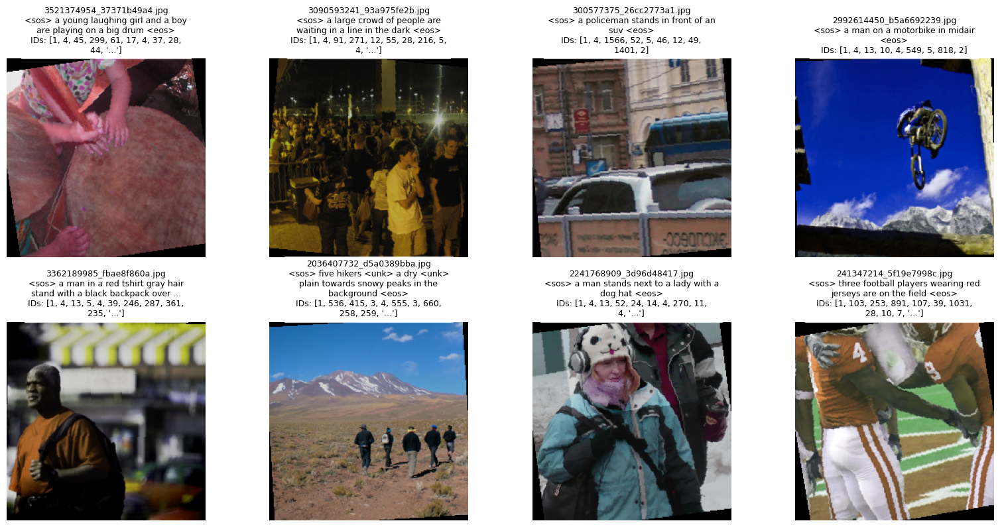

In [ ]:
def visualize_batch(loader, vocab, num_samples=8, max_caption_words=15, cols=4):
    images, captions, lengths, names = next(iter(loader))
    num_samples = min(num_samples, images.size(0))
    rows = math.ceil(num_samples / cols)

    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    if isinstance(axes, np.ndarray):
        axes = axes.flatten()
    else:
        axes = [axes]

    for i in range(num_samples):
        ax = axes[i]
        img = images[i].cpu() * std + mean
        img = img.permute(1, 2, 0).numpy()
        img = np.clip(img, 0, 1)

        caption_ids = captions[i][:lengths[i]].tolist()
        words = vocab.decode(caption_ids)
        if len(words) > max_caption_words:
            words_display = words[:max_caption_words] + ["..."]
        else:
            words_display = words
        decoded_caption = " ".join(words_display)

        token_display = caption_ids[:10]
        if len(caption_ids) > 10:
            token_display = token_display + ["..."]

        ax.imshow(img)
        ax.axis("off")
        title_lines = [
            f"{names[i]}",
            decoded_caption,
            f"IDs: {token_display}"
        ]
        title_text = "\n".join(
            [textwrap.fill(line, width=40) for line in title_lines]
        )
        ax.set_title(title_text, fontsize=9, pad=6)
        ax.title.set_backgroundcolor((1, 1, 1, 0.65))

    for j in range(num_samples, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

visualize_batch(train_loader, vocab, num_samples=8)

## **4.2 Creating the Image Captioning Model**

For this assignment, **you are required to create your own custom image captioning model** and **compare its performance** with an existing pre-trained model.

---

### **Encoder-Attention-Decoder Architecture**

Your model should follow an **Encoder-Attention-Decoder** structure with the following components:

- The **Encoder** processes images to extract meaningful features. You can either design a **custom convolutional architecture** or use a **pre-trained model** like *ResNet*, but **fine-tuning is required** to adapt the features to the captioning task.
- The **Attention Layer** acts as an interface between the encoder and decoder. It leverages the extracted image features to compute **attention scores**, helping the decoder focus on relevant parts of the image during caption generation. For simplicity, use **Linear layers** to implement the attention mechanism.
- The **Decoder** is a sequence-based model (e.g., *LSTM*) that processes the image features and generates captions sequentially.

---

#### **Extra Credit Opportunity**
- Additional points will be awarded for implementing either a **Vision Transformer (ViT) encoder** or a **Transformer-based decoder** instead of an LSTM.

Here is an example of something similar to what we want to create:
<img src="https://drive.google.com/thumbnail?id=1wdddaLit7iEyCcVy5bS505NiYzL6c-4x&sz=w1000">

```python
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        return NotImplementedError

    def forward(self, images):
        return NotImplementedError
```

```python
class Attention(nn.Module):
    def __init__(self, encoder_dim,decoder_dim,attention_dim):
        super(Attention, self).__init__()
        return NotImplementedError

    def forward(self, features, hidden_state):
        return NotImplementedError
```

```python
class Decoder(nn.Module):
    def __init__(self, embed_size, vocab_size, attention_dim, encoder_dim, decoder_dim):
        return NotImplementedError

    def forward(self, features, captions):
        return NotImplementedError
```
```python
class EncoderDecoder(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim, encoder_dim,decoder_dim):
        return NotImplementedError

    def forward(self, images, captions):
        return NotImplementedError
```

In [ ]:
class Encoder(nn.Module):
    def __init__(self, encoded_image_size=14):
        super(Encoder, self).__init__()
        resnet = models.resnet50(pretrained=True)
        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)
        self.adaptive_pool = nn.AdaptiveAvgPool2d((encoded_image_size, encoded_image_size))
        self.fine_tune()

    def forward(self, images):
        features = self.resnet(images)
        features = self.adaptive_pool(features)
        features = features.permute(0, 2, 3, 1)
        batch_size = features.size(0)
        encoder_dim = features.size(-1)
        features = features.view(batch_size, -1, encoder_dim)
        return features

    def fine_tune(self, fine_tune=True):
        for param in self.resnet.parameters():
            param.requires_grad = False
        for module in list(self.resnet.children())[5:]:
            for param in module.parameters():
                param.requires_grad = fine_tune

In [ ]:
class Attention(nn.Module):
    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        super(Attention, self).__init__()
        self.encoder_att = nn.Linear(encoder_dim, attention_dim)
        self.decoder_att = nn.Linear(decoder_dim, attention_dim)
        self.full_att = nn.Linear(attention_dim, 1)
        self.relu = nn.ReLU()
        self.softmax = nn.Softmax(dim=1)

    def forward(self, encoder_out, decoder_hidden):
        att1 = self.encoder_att(encoder_out)
        att2 = self.decoder_att(decoder_hidden)
        att = self.full_att(self.relu(att1 + att2.unsqueeze(1))).squeeze(2)
        alpha = self.softmax(att)
        attention_weighted_encoding = (encoder_out * alpha.unsqueeze(2)).sum(dim=1)
        return attention_weighted_encoding, alpha

In [ ]:
class Decoder(nn.Module):
    def __init__(self, attention_dim, embed_dim, decoder_dim, vocab_size, encoder_dim, dropout=0.5):
        super(Decoder, self).__init__()
        self.encoder_dim = encoder_dim
        self.attention_dim = attention_dim
        self.embed_dim = embed_dim
        self.decoder_dim = decoder_dim
        self.vocab_size = vocab_size
        self.dropout = dropout

        self.attention = Attention(encoder_dim, decoder_dim, attention_dim)
        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.dropout_layer = nn.Dropout(p=self.dropout)
        self.decode_step = nn.LSTMCell(embed_dim + encoder_dim, decoder_dim, bias=True)
        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        self.init_c = nn.Linear(encoder_dim, decoder_dim)
        self.fc = nn.Linear(decoder_dim, vocab_size)
        self.gate = nn.Linear(decoder_dim, encoder_dim)
        self.init_weights()

    def init_weights(self):
        self.embedding.weight.data.uniform_(-0.1, 0.1)
        self.fc.bias.data.fill_(0)
        self.fc.weight.data.uniform_(-0.1, 0.1)

    def forward(self, encoder_out, encoded_captions, caption_lengths):
        batch_size = encoder_out.size(0)
        encoder_dim = encoder_out.size(-1)
        vocab_size = self.vocab_size

        embeddings = self.embedding(encoded_captions)

        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)
        c = self.init_c(mean_encoder_out)

        decode_lengths = (caption_lengths - 1).tolist()

        predictions = torch.zeros(batch_size, max(decode_lengths), vocab_size).to(encoder_out.device)
        alphas = torch.zeros(batch_size, max(decode_lengths), encoder_out.size(1)).to(encoder_out.device)

        for t in range(max(decode_lengths)):
            batch_size_t = sum([l > t for l in decode_lengths])
            attention_weighted_encoding, alpha = self.attention(encoder_out[:batch_size_t], h[:batch_size_t])
            gate = torch.sigmoid(self.gate(h[:batch_size_t]))
            attention_weighted_encoding = gate * attention_weighted_encoding
            h, c = self.decode_step(
                torch.cat([embeddings[:batch_size_t, t, :], attention_weighted_encoding], dim=1),
                (h[:batch_size_t], c[:batch_size_t])
            )
            preds = self.fc(self.dropout_layer(h))
            predictions[:batch_size_t, t, :] = preds
            alphas[:batch_size_t, t, :] = alpha

        return predictions, alphas, decode_lengths

In [ ]:
class EncoderDecoder(nn.Module):
    def __init__(self, attention_dim, embed_dim, decoder_dim, vocab_size, encoder_dim=2048, dropout=0.5):
        super(EncoderDecoder, self).__init__()
        self.encoder = Encoder()
        self.decoder = Decoder(attention_dim, embed_dim, decoder_dim, vocab_size, encoder_dim, dropout)

    def forward(self, images, captions, caption_lengths):
        encoder_out = self.encoder(images)
        predictions, alphas, decode_lengths = self.decoder(encoder_out, captions, caption_lengths)
        return predictions, alphas, decode_lengths

## **5. Defining Loss Function and Optimizer**

**Loss Functions and their options:**

In an **image captioning task**, the model generates a sequence of words conditioned on an image. This involves both **sequence generation (language modeling)** and **image understanding**, making loss selection crucial for effective training. The primary loss function should optimize **word prediction** while ensuring **grammatical correctness and semantic coherence**.

Since our task involves **predicting discrete word tokens**, we typically use **sequence-based loss functions**, but we can also explore loss functions that account for **semantic meaning** and **alignment**.

---

### **a. Cross-Entropy Loss (Standard Sequence Prediction Loss)**  
The most common loss for text generation tasks is **Cross-Entropy Loss**, which measures the difference between the **predicted word probability distribution** and the **true word** in the sequence. It is computed as:

$$
\mathcal{L}_{CE} = -\sum_{t=1}^{T} y_t \log(\hat{y}_t)
$$

where:
- $T $ is the sequence length (number of words in the caption),
- $ y_t $ is the **ground truth word** (one-hot encoded),
- $ \hat{y}_t $ is the **predicted probability** of that word.

- **Pros:** Simple, well-established for text generation tasks, easy to implement.
- **Cons:** Treats each word prediction independently, ignoring sentence-level meaning, but useful during `teacher forcing`.

---

### **b. CIDER Loss (Reinforcement Learning-Based Caption Quality Loss)**  
Cross-Entropy loss focuses on **token-level** accuracy, but it does not capture **sentence-level fluency and meaning**. CIDER (Consensus-based Image Description Evaluation) helps optimize captions towards human-like descriptions.

$$
\mathcal{L}_{CIDEr} = 1 - CIDEr(\hat{Y}, Y)
$$

where $ CIDEr(\hat{Y}, Y) $ measures how similar the generated caption $ \hat{Y} $ is to multiple reference captions $ Y $.

- **Pros:** Optimizes for caption similarity to human references, improves fluency. Best suited for **fine-tuning after pretraining with Cross-Entropy** Loss.
- **Cons:** Harder to optimize, requires reinforcement learning.

---

### **c. Reinforcement Learning-Based Loss (REINFORCE with Self-Critical Sequence Training - SCST)**  
Since captioning is **sequential**, we can treat it as a reinforcement learning problem. Instead of directly predicting words, we train the model to maximize **rewards** (e.g., BLEU or CIDEr scores). This is done using the **REINFORCE** algorithm:

$$
\mathcal{L}_{RL} = - (r(\hat{Y}) - r(\bar{Y})) \sum_{t=1}^{T} \log P(y_t | y_{1:t-1}, X)
$$

where:
- $ r(\hat{Y}) $ is the reward for the generated caption,
- $ r(\bar{Y}) $ is the baseline reward (e.g., score from a greedy decoder).

- **Pros:** Optimizes **sentence-level metrics** instead of per-word accuracy, leading to better captions.  
- **Cons:** Computationally expensive, requires careful tuning.   

---

[PyTorch Documentation](https://pytorch.org/docs/stable/nn.html#loss-functions)

---

**Optimizers and their options:**

There are some pre-built [Optimizers in PyTorch](https://pytorch.org/docs/stable/optim.html), they are sufficient in most cases, especially if their parameters are well set. The two most well-known are Adam (AdamW) and SGD, both of which originate from Gradient Descent, which we implemented earlier.

* **S**tochastic **G**radient **D**escent ([SGD](https://pytorch.org/docs/stable/generated/torch.optim.SGD.html))
* **ADA**ptive **M**oment optimizer ([ADAM](https://pytorch.org/docs/stable/generated/torch.optim.Adam.html))
* [A good general overview](https://www.ruder.io/optimizing-gradient-descent/)

In [ ]:
attention_dim = 256
embed_dim = 512
decoder_dim = 512
encoder_dim = 2048
vocab_size = len(vocab)
dropout = 0.5
learning_rate = 4e-4

model = EncoderDecoder(
    attention_dim=attention_dim,
    embed_dim=embed_dim,
    decoder_dim=decoder_dim,
    vocab_size=vocab_size,
    encoder_dim=encoder_dim,
    dropout=dropout
).to(device)

criterion = nn.CrossEntropyLoss(ignore_index=vocab.stoi["<pad>"])
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)

print(f"Model initialized with {sum(p.numel() for p in model.parameters()):,} parameters")
print(f"Trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")

Model initialized with 36,171,013 parameters
Trainable parameters: 35,945,669


## **6. Training the Image Captioning Model**

When implementing the training loop, ensure the following key aspects are included:

- Set an **appropriate number of epochs** for model training, balancing between underfitting and overfitting.
- Maintain running losses throughout each epoch and compute both **training loss** and **validation loss** per epoch.
- Implement an **early stopping mechanism** to halt training if validation loss stops improving, preventing unnecessary overfitting.
- **Save the model at its best-performing epoch** based on validation loss, ensuring the best version is retained for inference.

> **Note**: Pay attention to your choices. **Be aware of overfitting** and underfitting. Make sure the **loss is decreasing over the epochs**. Save the losses so that they can be visualized.

In [ ]:
num_epochs = 20
best_val_loss = float('inf')
patience = 5
patience_counter = 0
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0

    train_pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs} [Train]')
    for images, captions, lengths, _ in train_pbar:
        images = images.to(device)
        captions = captions.to(device)
        lengths = lengths.to(device)

        optimizer.zero_grad()
        predictions, alphas, decode_lengths = model(images, captions, lengths)

        targets = captions[:, 1:]
        predictions = predictions.view(-1, vocab_size)
        targets = targets.reshape(-1)

        loss = criterion(predictions, targets)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)
        optimizer.step()

        train_loss += loss.item()
        train_pbar.set_postfix({'loss': loss.item()})

    avg_train_loss = train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    model.eval()
    val_loss = 0.0

    with torch.no_grad():
        val_pbar = tqdm(val_loader, desc=f'Epoch {epoch+1}/{num_epochs} [Val]')
        for images, captions, lengths, _ in val_pbar:
            images = images.to(device)
            captions = captions.to(device)
            lengths = lengths.to(device)

            predictions, alphas, decode_lengths = model(images, captions, lengths)

            targets = captions[:, 1:]
            predictions = predictions.view(-1, vocab_size)
            targets = targets.reshape(-1)

            loss = criterion(predictions, targets)
            val_loss += loss.item()
            val_pbar.set_postfix({'loss': loss.item()})

    avg_val_loss = val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    scheduler.step(avg_val_loss)

    print(f"Epoch [{epoch+1}/{num_epochs}] Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")

    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        patience_counter = 0
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'train_loss': avg_train_loss,
            'val_loss': avg_val_loss,
        }, 'best_model.pth')
        print(f"Saved best model with val loss: {best_val_loss:.4f}")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"Early stopping triggered after {epoch+1} epochs")
            break

torch.save({
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'train_losses': train_losses,
    'val_losses': val_losses,
}, 'last_checkpoint.pth')

print("Training completed!")

Epoch 1/20 [Val]: 100%|██████████| 190/190 [00:37<00:00,  5.01it/s, loss=3.94]


Epoch [1/20] Train Loss: 4.4151 | Val Loss: 4.0821
Saved best model with val loss: 4.0821


Epoch 2/20 [Val]: 100%|██████████| 190/190 [00:37<00:00,  5.04it/s, loss=3.69]


Epoch [2/20] Train Loss: 4.0384 | Val Loss: 3.8816
Saved best model with val loss: 3.8816


Epoch 3/20 [Val]: 100%|██████████| 190/190 [00:37<00:00,  5.05it/s, loss=3.42]


Epoch [3/20] Train Loss: 3.8604 | Val Loss: 3.7713
Saved best model with val loss: 3.7713


Epoch 4/20 [Val]: 100%|██████████| 190/190 [00:37<00:00,  5.11it/s, loss=3.41]


Epoch [4/20] Train Loss: 3.7291 | Val Loss: 3.7095
Saved best model with val loss: 3.7095


Epoch 5/20 [Val]: 100%|██████████| 190/190 [00:37<00:00,  5.04it/s, loss=3.33]


Epoch [5/20] Train Loss: 3.6361 | Val Loss: 3.6684
Saved best model with val loss: 3.6684


Epoch 6/20 [Val]: 100%|██████████| 190/190 [00:36<00:00,  5.16it/s, loss=3.32]


Epoch [6/20] Train Loss: 3.5576 | Val Loss: 3.6402
Saved best model with val loss: 3.6402


Epoch 7/20 [Val]: 100%|██████████| 190/190 [00:37<00:00,  5.12it/s, loss=3.32]


Epoch [7/20] Train Loss: 3.4840 | Val Loss: 3.6228
Saved best model with val loss: 3.6228


Epoch 8/20 [Val]: 100%|██████████| 190/190 [00:37<00:00,  5.10it/s, loss=3.23]


Epoch [8/20] Train Loss: 3.4217 | Val Loss: 3.5930
Saved best model with val loss: 3.5930


Epoch 9/20 [Val]: 100%|██████████| 190/190 [00:37<00:00,  5.07it/s, loss=3.32]


Epoch [9/20] Train Loss: 3.3643 | Val Loss: 3.5900
Saved best model with val loss: 3.5900


Epoch 10/20 [Val]: 100%|██████████| 190/190 [00:37<00:00,  5.06it/s, loss=3.25]


Epoch [10/20] Train Loss: 3.3086 | Val Loss: 3.5843
Saved best model with val loss: 3.5843


Epoch 11/20 [Val]: 100%|██████████| 190/190 [00:37<00:00,  5.11it/s, loss=3.26]


Epoch [11/20] Train Loss: 3.2543 | Val Loss: 3.5798
Saved best model with val loss: 3.5798


Epoch 12/20 [Val]: 100%|██████████| 190/190 [00:37<00:00,  5.12it/s, loss=3.25]


Epoch [12/20] Train Loss: 3.1998 | Val Loss: 3.5910


Epoch 13/20 [Val]: 100%|██████████| 190/190 [00:37<00:00,  5.00it/s, loss=3.27]


Epoch [13/20] Train Loss: 3.1453 | Val Loss: 3.5859


Epoch 14/20 [Val]: 100%|██████████| 190/190 [00:37<00:00,  5.02it/s, loss=3.35]


Epoch [14/20] Train Loss: 3.1025 | Val Loss: 3.5957


Epoch 15/20 [Val]: 100%|██████████| 190/190 [00:37<00:00,  5.08it/s, loss=3.28]


Epoch [15/20] Train Loss: 3.0554 | Val Loss: 3.5950


Epoch 16/20 [Val]: 100%|██████████| 190/190 [00:36<00:00,  5.18it/s, loss=3.25]


Epoch [16/20] Train Loss: 2.9462 | Val Loss: 3.5955
Early stopping triggered after 16 epochs
Training completed!


## **7.1 Visualizing Training Metrics**

- **Restore the model's parameters** from the checkpoint where validation loss was lowest to use the most optimal version of the model.
- Use `Matplotlib` or `Seaborn` to plot the loss curves over epochs.

Did your model **converge**? Explain your results!

```python
def plot_losses():
  raise NotImplementedError
```

Loaded best model from epoch 11 with val loss: 3.5798


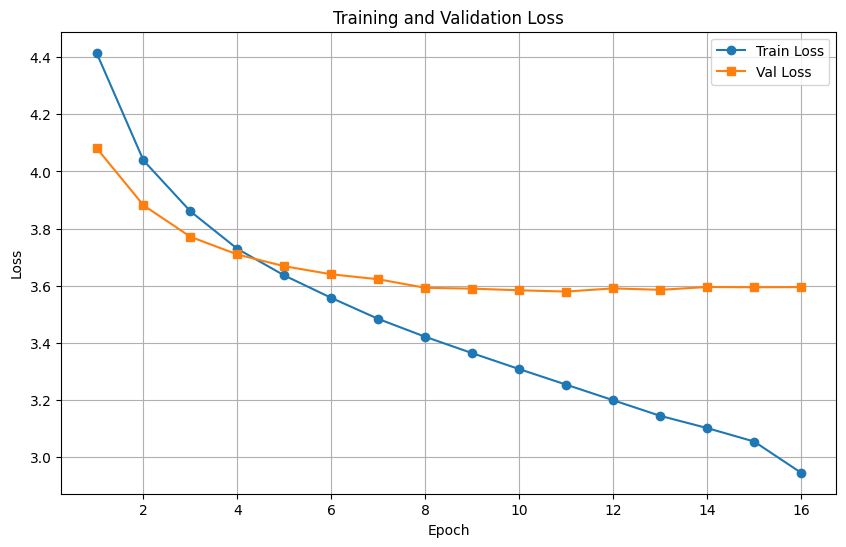


Final Train Loss: 2.9462
Final Val Loss: 3.5955
Best Val Loss: 3.5798 at epoch 11


In [ ]:
checkpoint = torch.load('best_model.pth', map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
print(f"Loaded best model from epoch {checkpoint['epoch']+1} with val loss: {checkpoint['val_loss']:.4f}")

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses)+1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses)+1), val_losses, label='Val Loss', marker='s')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

print(f"\nFinal Train Loss: {train_losses[-1]:.4f}")
print(f"Final Val Loss: {val_losses[-1]:.4f}")
print(f"Best Val Loss: {min(val_losses):.4f} at epoch {val_losses.index(min(val_losses))+1}")

The model partially converged. The training loss keeps decreasing steadily, while the validation loss plateaus after around epoch 11, showing the best value there. This suggests the model learned useful patterns but started to overfit after that point. Early stopping around epoch 11 could help prevent overfitting and improve generalization.

## **7.2 Visualizing Attention Weights**

Visualize the attention weigths in order to understand how your model learned.
For that, use the `context` variable returned by the **Attention class** to overlay them on the image.

```python
def plot_attention():
  raise NotImplementedError
```

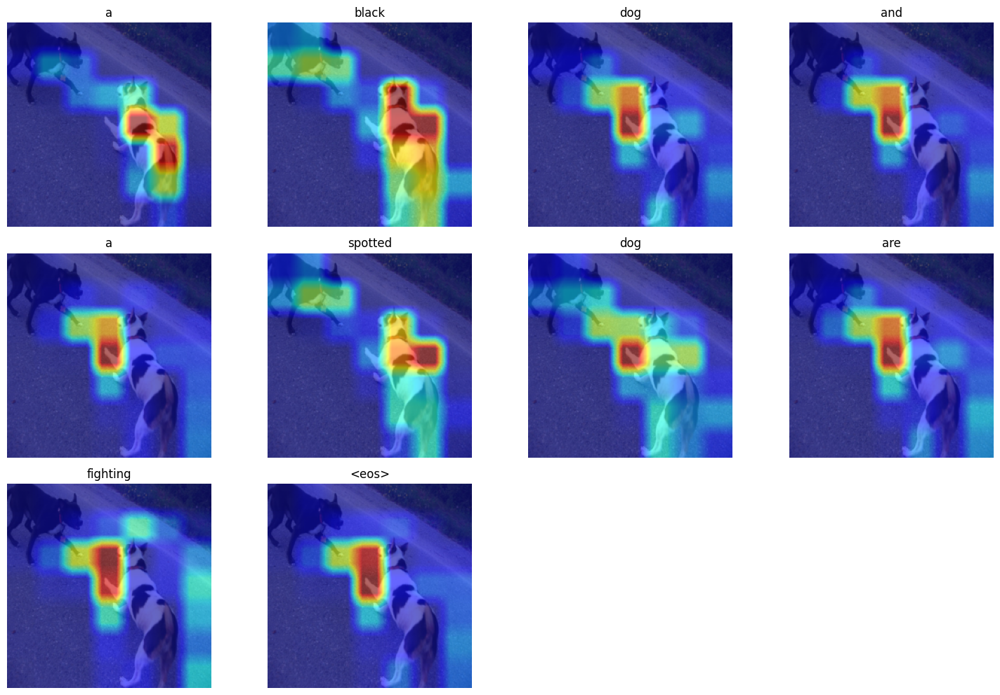

In [ ]:
def visualize_attention(image_tensor, caption, alphas, vocab, image_size=14):
    image = image_tensor.cpu()
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    image = image * std + mean
    image = image.permute(1, 2, 0).numpy()
    image = np.clip(image, 0, 1)

    # Convert tensor indices to Python integers using .item()
    words = [vocab.itos[idx.item()] for idx in caption if idx.item() not in [vocab.stoi['<pad>'], vocab.stoi['<sos>']]]
    alphas = alphas[:len(words)]

    num_words = min(len(words), 12)
    fig = plt.figure(figsize=(15, 10))

    for i in range(num_words):
        ax = fig.add_subplot(3, 4, i+1)
        ax.imshow(image)

        alpha = alphas[i].view(image_size, image_size).cpu().detach().numpy()
        alpha_resized = np.array(Image.fromarray(alpha).resize((image.shape[1], image.shape[0]), Image.BILINEAR))

        ax.imshow(alpha_resized, alpha=0.6, cmap='jet')
        ax.set_title(words[i], fontsize=12)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

model.eval()
with torch.no_grad():
    batch = next(iter(val_loader))
    images, captions, lengths, _ = batch
    images = images.to(device)
    captions = captions.to(device)
    lengths = lengths.to(device)

    predictions, alphas, decode_lengths = model(images, captions, lengths)

    idx = 0
    visualize_attention(images[idx], captions[idx][:lengths[idx]], alphas[idx], vocab)


## **7.3 Running Inference on the Image Captioning Model**

Pass test images through the **custom-trained image captioning model**, then evaluate its performance on the test set. Use the **[BLEU score](https://pytorch.org/text/stable/data_metrics.html)** as the evaluation metric, implementing **BLEU-1, BLEU-2, BLEU-3, and BLEU-4**.

To improve performance on the validation and test sets, you may use **beam search decoding** instead of standard greedy decoding.  

[Beam Search](https://d2l.ai/chapter_recurrent-modern/beam-search.html) is a more sophisticated decoding algorithm that **considers multiple possible caption sequences at each time step instead of selecting the most probable word at every step (greedy decoding)**. It maintains a fixed number of candidate sequences (beam width) and expands them based on their cumulative probabilities, ultimately selecting the **most likely complete caption**.  

Using beam search can lead to **more fluent and accurate captions** by avoiding suboptimal word choices that greedy decoding might make.

```python
def test_model()
  raise NotImplementedError
```

Generating captions...


100%|██████████| 100/100 [00:03<00:00, 31.95it/s]



BLEU Scores on Test Set (100 images):
BLEU-1: 0.5277
BLEU-2: 0.3509
BLEU-3: 0.2343
BLEU-4: 0.1563


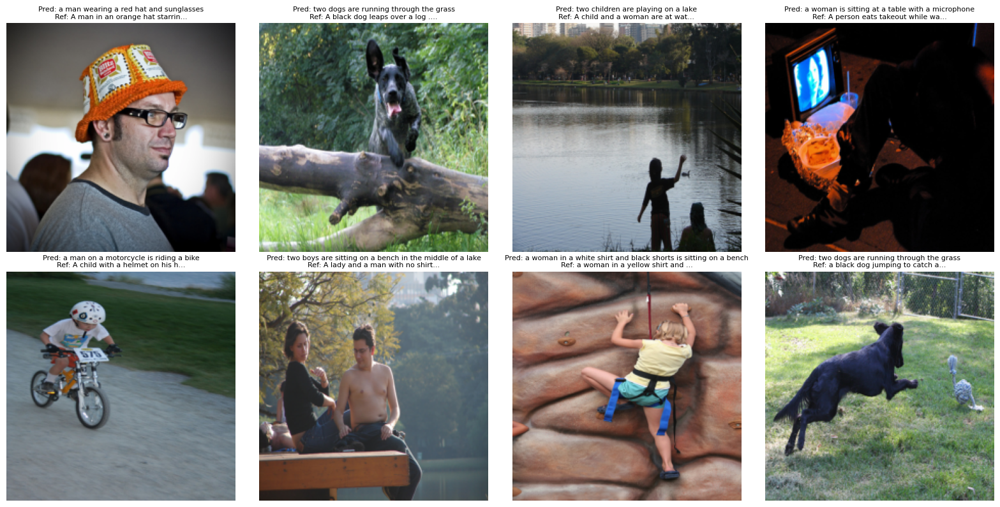

In [ ]:
def greedy_decode(model, image, vocab, max_length=50):
    model.eval()
    with torch.no_grad():
        encoder_out = model.encoder(image.unsqueeze(0).to(device))

        h = model.decoder.init_h(encoder_out.mean(dim=1))
        c = model.decoder.init_c(encoder_out.mean(dim=1))

        caption = [vocab.stoi['<sos>']]

        for _ in range(max_length):
            embeddings = model.decoder.embedding(torch.LongTensor([caption[-1]]).to(device))
            attention_weighted_encoding, alpha = model.decoder.attention(encoder_out, h)
            gate = torch.sigmoid(model.decoder.gate(h))
            attention_weighted_encoding = gate * attention_weighted_encoding

            h, c = model.decoder.decode_step(
                torch.cat([embeddings, attention_weighted_encoding], dim=1),
                (h, c)
            )

            preds = model.decoder.fc(model.decoder.dropout_layer(h))
            predicted = preds.argmax(1).item()
            caption.append(predicted)

            if predicted == vocab.stoi['<eos>']:
                break

        return caption

test_df = pd.read_csv(test_csv)
test_images_grouped = test_df.groupby('image')['caption'].apply(list).to_dict()

bleu1 = BLEUScore(n_gram=1)
bleu2 = BLEUScore(n_gram=2)
bleu3 = BLEUScore(n_gram=3)
bleu4 = BLEUScore(n_gram=4)

model.eval()
predictions = []
references = []

print("Generating captions...")
for img_name, ref_captions in tqdm(list(test_images_grouped.items())[:100]):
    img_path = os.path.join(images_root, img_name)
    image = Image.open(img_path).convert('RGB')
    image = test_transforms(image)

    caption_ids = greedy_decode(model, image, vocab)
    caption_words = [vocab.itos.get(idx, '<unk>') for idx in caption_ids if idx not in [vocab.stoi['<pad>'], vocab.stoi['<sos>'], vocab.stoi['<eos>']]]
    pred_caption = ' '.join(caption_words)

    predictions.append(pred_caption)
    references.append(ref_captions)

bleu1_score = bleu1(predictions, references)
bleu2_score = bleu2(predictions, references)
bleu3_score = bleu3(predictions, references)
bleu4_score = bleu4(predictions, references)

print(f"\nBLEU Scores on Test Set (100 images):")
print(f"BLEU-1: {bleu1_score:.4f}")
print(f"BLEU-2: {bleu2_score:.4f}")
print(f"BLEU-3: {bleu3_score:.4f}")
print(f"BLEU-4: {bleu4_score:.4f}")

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

for i, (img_name, ref_captions) in enumerate(list(test_images_grouped.items())[:8]):
    img_path = os.path.join(images_root, img_name)
    image = Image.open(img_path).convert('RGB')
    image_tensor = test_transforms(image)

    caption_ids = greedy_decode(model, image_tensor, vocab)
    caption_words = [vocab.itos.get(idx, '<unk>') for idx in caption_ids if idx not in [vocab.stoi['<pad>'], vocab.stoi['<sos>'], vocab.stoi['<eos>']]]
    pred_caption = ' '.join(caption_words)

    img_display = image_tensor * std + mean
    img_display = img_display.permute(1, 2, 0).numpy()
    img_display = np.clip(img_display, 0, 1)

    axes[i].imshow(img_display)
    axes[i].axis('off')
    axes[i].set_title(f"Pred: {pred_caption}\nRef: {ref_captions[0][:30]}...", fontsize=8, wrap=True)

plt.tight_layout()
plt.show()

## **8. Loading an Existing Image Captioning Model**

You are free to select any pre-trained image captioning model available. We recommend considering the following options:

1. **BLIP (Bootstrapping Language-Image Pre-training):** BLIP is a versatile vision-language pre-training framework that excels in both understanding and generation tasks. It effectively utilizes noisy web data by generating and filtering synthetic captions, achieving SOTA results in image captioning. Pre-trained models and code are available on [GitHub](https://github.com/salesforce/BLIP) and the [Hugging Face Model Hub](https://huggingface.co/Salesforce/blip-image-captioning-base).

2. **ViT-GPT2 Image Captioning Model:** This model combines a Vision Transformer (ViT) as the encoder and GPT-2 as the decoder, effectively connecting visual inputs with text generation. A fine-tuned version on the Flickr8k dataset is accessible on the [Hugging Face Model Hub](https://huggingface.co/NourFakih/image-captioning-Vit-GPT2-Flickr8k).

In [ ]:
!pip install -q transformers
from transformers import BlipProcessor, BlipForConditionalGeneration

In [ ]:

processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
pretrained_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)

print("Loaded BLIP model")
print(f"Model parameters: {sum(p.numel() for p in pretrained_model.parameters()):,}")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]

Loaded BLIP model
Model parameters: 223,971,644


## **9. Evaluating the Existing Image Captioning Model**

For evaluation, apply the **same metrics** used in the assessment of your custom image captioning model to ensure a consistent and fair comparison.

Generating captions with BLIP model...


100%|██████████| 100/100 [00:30<00:00,  3.30it/s]



BLIP Model BLEU Scores on Test Set (100 images):
BLEU-1: 0.5502
BLEU-2: 0.3792
BLEU-3: 0.2508
BLEU-4: 0.1580


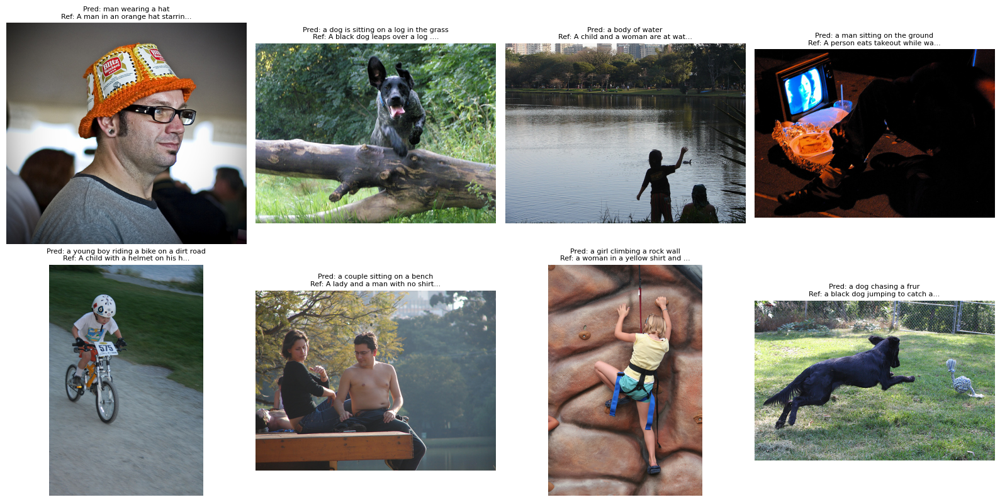

In [ ]:
bleu1_pretrained = BLEUScore(n_gram=1)
bleu2_pretrained = BLEUScore(n_gram=2)
bleu3_pretrained = BLEUScore(n_gram=3)
bleu4_pretrained = BLEUScore(n_gram=4)

pretrained_model.eval()
pretrained_predictions = []
pretrained_references = []

print("Generating captions with BLIP model...")
for img_name, ref_captions in tqdm(list(test_images_grouped.items())[:100]):
    img_path = os.path.join(images_root, img_name)
    image = Image.open(img_path).convert('RGB')

    inputs = processor(image, return_tensors="pt").to(device)

    with torch.no_grad():
        generated_ids = pretrained_model.generate(**inputs, max_length=50)

    pred_caption = processor.decode(generated_ids[0], skip_special_tokens=True)

    pretrained_predictions.append(pred_caption)
    pretrained_references.append(ref_captions)

bleu1_score_pretrained = bleu1_pretrained(pretrained_predictions, pretrained_references)
bleu2_score_pretrained = bleu2_pretrained(pretrained_predictions, pretrained_references)
bleu3_score_pretrained = bleu3_pretrained(pretrained_predictions, pretrained_references)
bleu4_score_pretrained = bleu4_pretrained(pretrained_predictions, pretrained_references)

print(f"\nBLIP Model BLEU Scores on Test Set (100 images):")
print(f"BLEU-1: {bleu1_score_pretrained:.4f}")
print(f"BLEU-2: {bleu2_score_pretrained:.4f}")
print(f"BLEU-3: {bleu3_score_pretrained:.4f}")
print(f"BLEU-4: {bleu4_score_pretrained:.4f}")

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

for i, (img_name, ref_captions) in enumerate(list(test_images_grouped.items())[:8]):
    img_path = os.path.join(images_root, img_name)
    image = Image.open(img_path).convert('RGB')

    inputs = processor(image, return_tensors="pt").to(device)
    with torch.no_grad():
        generated_ids = pretrained_model.generate(**inputs, max_length=50)
    pred_caption = processor.decode(generated_ids[0], skip_special_tokens=True)

    axes[i].imshow(image)
    axes[i].axis('off')
    axes[i].set_title(f"Pred: {pred_caption}\nRef: {ref_captions[0][:30]}...", fontsize=8, wrap=True)

plt.tight_layout()
plt.show()

## **10. Comparing the Two Models**

Compare the performance of both models using **BLEU-1, BLEU-2, BLEU-3, and BLEU-4** scores. Visualize predictions from both models on the **same batch of test images** to highlight their differences.

Analyze and justify the differences in performance, discussing factors such as model architecture, attention mechanisms, and training strategies. Finally, **propose possible improvements for your custom model**.

> **Answer**: The BLIP model performs slightly better across all BLEU scores, producing captions closer to the ground truth. Visually, BLIP gives more accurate and general descriptions, while the custom model adds small errors. This is likely due to BLIP’s transformer-based architecture and large-scale pretraining. The custom model could improve by adding attention layers and training on more diverse data.

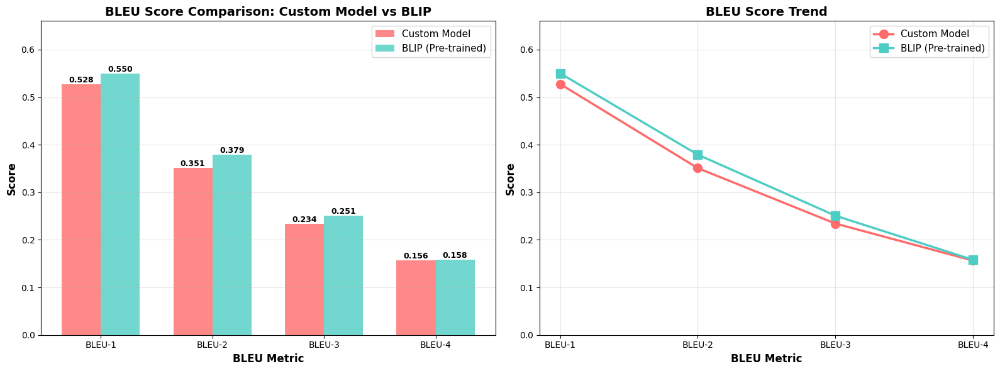


BLEU SCORE COMPARISON TABLE
Metric          Custom Model         BLIP Model           Difference     
------------------------------------------------------------
BLEU-1          0.5277               0.5502               +0.0225
BLEU-2          0.3509               0.3792               +0.0283
BLEU-3          0.2343               0.2508               +0.0165
BLEU-4          0.1563               0.1580               +0.0017

Generating side-by-side comparison visualizations...


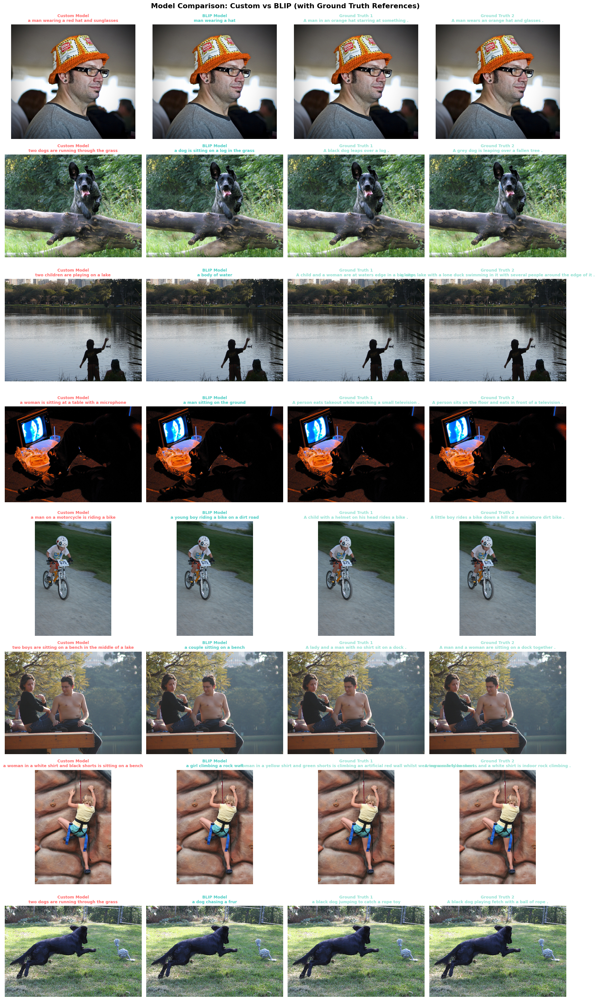


PERFORMANCE ANALYSIS
Average Custom Model BLEU: 0.3173
Average BLIP Model BLEU: 0.3346
Relative Improvement: +5.44%


In [ ]:
# Comparison of BLEU Scores
custom_scores = [bleu1_score.item(), bleu2_score.item(), bleu3_score.item(), bleu4_score.item()]
pretrained_scores = [bleu1_score_pretrained.item(), bleu2_score_pretrained.item(),
                     bleu3_score_pretrained.item(), bleu4_score_pretrained.item()]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Bar chart comparison
x = np.arange(4)
width = 0.35
bleu_labels = ['BLEU-1', 'BLEU-2', 'BLEU-3', 'BLEU-4']

bars1 = ax1.bar(x - width/2, custom_scores, width, label='Custom Model', color='#FF6B6B', alpha=0.8)
bars2 = ax1.bar(x + width/2, pretrained_scores, width, label='BLIP (Pre-trained)', color='#4ECDC4', alpha=0.8)

ax1.set_xlabel('BLEU Metric', fontsize=12, fontweight='bold')
ax1.set_ylabel('Score', fontsize=12, fontweight='bold')
ax1.set_title('BLEU Score Comparison: Custom Model vs BLIP', fontsize=14, fontweight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels(bleu_labels)
ax1.legend(fontsize=11)
ax1.grid(axis='y', alpha=0.3)
ax1.set_ylim(0, max(max(custom_scores), max(pretrained_scores)) * 1.2)

# Add value labels on bars
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.3f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

# Line plot comparison
ax2.plot(bleu_labels, custom_scores, marker='o', linewidth=2.5, markersize=10,
         label='Custom Model', color='#FF6B6B')
ax2.plot(bleu_labels, pretrained_scores, marker='s', linewidth=2.5, markersize=10,
         label='BLIP (Pre-trained)', color='#4ECDC4')

ax2.set_xlabel('BLEU Metric', fontsize=12, fontweight='bold')
ax2.set_ylabel('Score', fontsize=12, fontweight='bold')
ax2.set_title('BLEU Score Trend', fontsize=14, fontweight='bold')
ax2.legend(fontsize=11)
ax2.grid(True, alpha=0.3)
ax2.set_ylim(0, max(max(custom_scores), max(pretrained_scores)) * 1.2)

plt.tight_layout()
plt.show()

# Print comparison table
print("\n" + "="*60)
print("BLEU SCORE COMPARISON TABLE")
print("="*60)
print(f"{'Metric':<15} {'Custom Model':<20} {'BLIP Model':<20} {'Difference':<15}")
print("-"*60)
for i, metric in enumerate(bleu_labels):
    diff = pretrained_scores[i] - custom_scores[i]
    print(f"{metric:<15} {custom_scores[i]:<20.4f} {pretrained_scores[i]:<20.4f} {diff:+.4f}")
print("="*60)

# Side-by-side visualization of predictions
fig, axes = plt.subplots(8, 4, figsize=(18, 32))

print("\nGenerating side-by-side comparison visualizations...")
for i, (img_name, ref_captions) in enumerate(list(test_images_grouped.items())[:8]):
    img_path = os.path.join(images_root, img_name)
    image = Image.open(img_path).convert('RGB')
    image_tensor = test_transforms(image)

    # Custom model prediction
    caption_ids = greedy_decode(model, image_tensor, vocab)
    caption_words = [vocab.itos.get(idx, '<unk>') for idx in caption_ids
                     if idx not in [vocab.stoi['<pad>'], vocab.stoi['<sos>'], vocab.stoi['<eos>']]]
    custom_pred = ' '.join(caption_words)

    # BLIP model prediction
    inputs = processor(image, return_tensors="pt").to(device)
    with torch.no_grad():
        generated_ids = pretrained_model.generate(**inputs, max_length=50)
    blip_pred = processor.decode(generated_ids[0], skip_special_tokens=True)

    # Plot custom model result
    axes[i, 0].imshow(image)
    axes[i, 0].axis('off')
    axes[i, 0].set_title(f"Custom Model\n{custom_pred}", fontsize=9, color='#FF6B6B', fontweight='bold')

    # Plot BLIP model result
    axes[i, 1].imshow(image)
    axes[i, 1].axis('off')
    axes[i, 1].set_title(f"BLIP Model\n{blip_pred}", fontsize=9, color='#4ECDC4', fontweight='bold')

    # Plot ground truth
    axes[i, 2].imshow(image)
    axes[i, 2].axis('off')
    axes[i, 2].set_title(f"Ground Truth 1\n{ref_captions[0]}", fontsize=9, color='#95E1D3', fontweight='bold')

    # Plot another reference
    axes[i, 3].imshow(image)
    axes[i, 3].axis('off')
    axes[i, 3].set_title(f"Ground Truth 2\n{ref_captions[1]}", fontsize=9, color='#95E1D3', fontweight='bold')

plt.suptitle('Model Comparison: Custom vs BLIP (with Ground Truth References)',
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

# Performance difference summary
print("\n" + "="*60)
print("PERFORMANCE ANALYSIS")
print("="*60)
improvement = ((np.mean(pretrained_scores) - np.mean(custom_scores)) / np.mean(custom_scores)) * 100
print(f"Average Custom Model BLEU: {np.mean(custom_scores):.4f}")
print(f"Average BLIP Model BLEU: {np.mean(pretrained_scores):.4f}")
print(f"Relative Improvement: {improvement:+.2f}%")
print("="*60)


Please make sure to download your `.ipynb` file, and upload it to **Canvas** on time!

<img src="https://www.usatoday.com/gcdn/authoring/authoring-images/2023/08/25/USAT/70680172007-alertsm.png?crop=2099,1187,x0,y156" alt="1" border="0">



In [ ]:
from datetime import datetime, timedelta, timezone

deadline = datetime(2025, 11, 25, 23, 59, 0, tzinfo=timezone.utc)

def time_until_deadline():
    now = datetime.now(timezone.utc)
    remaining = deadline - now
    if remaining.total_seconds() <= 0:
        return "Time's up!"
    days = remaining.days
    hours, remainder = divmod(remaining.seconds, 3600)
    minutes, _ = divmod(remainder, 60)

    return f"{days} days, {hours} hours, {minutes} minutes"

print("Time left until submission:", time_until_deadline())

Time left until submission: 2 days, 7 hours, 46 minutes
